# Setup

Download required libraries

In [1]:
%%capture
!sudo apt install -y fluidsynth
!pip install pretty_midi
!pip install --upgrade pyfluidsynth
!pip install spotipy
!pip install tensorflow-addons

Imports

In [2]:
import collections
import pandas as pd
import numpy as np
import pretty_midi
import tensorflow as tf
from tensorflow.keras import models, layers, optimizers, losses, callbacks
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from itertools import product
import matplotlib.pyplot as plt
import spotipy
from IPython import display
from spotipy.oauth2 import SpotifyClientCredentials
from google.colab import drive
import os

drive.mount('/content/drive')

Mounted at /content/drive


# Prepare Data

Download maestro dataset

In [ ]:
!wget https://storage.googleapis.com/magentadata/datasets/maestro/v3.0.0/maestro-v3.0.0-midi.zip

--2022-04-26 01:52:04--  https://storage.googleapis.com/magentadata/datasets/maestro/v3.0.0/maestro-v3.0.0-midi.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.194.128, 173.194.198.128, 64.233.191.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.194.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 58416533 (56M) [application/octet-stream]
Saving to: ‘maestro-v3.0.0-midi.zip’

maestro-v3.0.0-midi 100%[===================>]  55.71M   132MB/s    in 0.4s    

2022-04-26 01:52:04 (132 MB/s) - ‘maestro-v3.0.0-midi.zip’ saved [58416533/58416533]



Unzip dataset

In [ ]:
!unzip maestro-v3.0.0-midi.zip -d .

Archive:  maestro-v3.0.0-midi.zip
  inflating: ./maestro-v3.0.0/2004/MIDI-Unprocessed_XP_08_R1_2004_01-02_ORIG_MID--AUDIO_08_R1_2004_01_Track01_wav.midi  
  inflating: ./maestro-v3.0.0/2004/MIDI-Unprocessed_XP_09_R1_2004_05_ORIG_MID--AUDIO_09_R1_2004_06_Track06_wav.midi  
  inflating: ./maestro-v3.0.0/2004/MIDI-Unprocessed_XP_14_R1_2004_01-03_ORIG_MID--AUDIO_14_R1_2004_01_Track01_wav.midi  
  inflating: ./maestro-v3.0.0/2004/MIDI-Unprocessed_XP_01_R1_2004_01-02_ORIG_MID--AUDIO_01_R1_2004_03_Track03_wav.midi  
  inflating: ./maestro-v3.0.0/2004/MIDI-Unprocessed_SMF_13_01_2004_01-05_ORIG_MID--AUDIO_13_R1_2004_09_Track09_wav.midi  
  inflating: ./maestro-v3.0.0/2004/MIDI-Unprocessed_XP_18_R1_2004_01-02_ORIG_MID--AUDIO_18_R1_2004_03_Track03_wav.midi  
  inflating: ./maestro-v3.0.0/2004/MIDI-Unprocessed_XP_19_R1_2004_01-02_ORIG_MID--AUDIO_19_R1_2004_01_Track01_wav.midi  
  inflating: ./maestro-v3.0.0/2004/MIDI-Unprocessed_XP_04_R1_2004_06_ORIG_MID--AUDIO_04_R1_2004_08_Track08_wav.midi  
  i

Get notes and harmony from midi files (~14 mins)

In [ ]:
# function modified from: https://www.tensorflow.org/tutorials/audio/music_generation
def midi_to_notes(midi_file, num_notes=100) -> pd.DataFrame:
  pm = pretty_midi.PrettyMIDI(midi_file)
  instrument = pm.instruments[0]
  notes = collections.defaultdict(list)

  # return empty dataframe if midi file has less than the requested number of notes
  if len(instrument.notes) < num_notes:
    return pd.DataFrame(columns=['midi_filename', 'order', 'pitch', 'step', 'duration'])

  # Sort the notes by start time
  sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
  prev_start = sorted_notes[0].start

  # create note data
  for i, note in enumerate(sorted_notes):
    start = note.start
    end = note.end
    notes['midi_filename'].append(midi_file)
    notes['order'].append(i)
    notes['pitch'].append(note.pitch)
    notes['start'].append(start)
    notes['end'].append(end)
    notes['step'].append(start - prev_start)
    notes['duration'].append(end - start)
    prev_start = start

    if i + 1 == num_notes:
      break

  return pd.DataFrame({name: np.array(value) for name, value in notes.items()})

In [ ]:
# helper functions for adding harmony
from heapq import nlargest

def get_pitch_class(pitch):
  return pitch % 12

def get_note_name(pitch):
  pitch_classes = {0 : 'C', 1 : 'C#/Db', 2 : 'D', 3 : 'D#/Eb', 4 : 'E', 5 : 'F', \
                  6 : 'F#/Gb', 7 : 'G', 8 : 'G#/Ab', 9 : 'A', 10 : 'A#/Bb', 11 : 'B'}
  return pitch_classes[get_pitch_class(pitch)]

def calculate_overlap(a_start_time, a_end_time, b_start_time, b_end_time):
  return max(min(a_end_time, b_end_time) - max(a_start_time, b_start_time), 0)

def return_top_n_classes(dist, N):
  return nlargest(N, {item[0]:item[1] for item in dist.items() if item[1] > 0}, key = dist.get)

In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer

# add harmony as an attribute
def get_harmony(notes, N, threshold):
  held_notes = {}
  pitch_class_dists = []
  i = 0
  for i in range(len(notes)):
    note = notes.iloc[i]
    # initialize a dict for pitch classes (C, E, B, Bb, etc.)
    pitch_class_dist = {get_note_name(x):0 for x in range(12)}
    # for all notes held over from before, check if ended or count overlap with current note
    held_notes_to_delete = []
    for held_note, held_end_time in held_notes.items():
      if held_end_time <= note.start:
        held_notes_to_delete.append(held_note)
      else:
        overlap = calculate_overlap(note.start, note.end, note.start, held_end_time)
        if overlap > threshold:
          pitch_class_dist[get_note_name(held_note)] += calculate_overlap(note.start, note.end, note.start, held_end_time)

    # update held note dictionary
    for x in held_notes_to_delete:
      del held_notes[x]
    held_notes[note.pitch] = note.end
    # consider all forthcoming overlapping notes
    j = i + 1
    while j < len(notes) and notes.iloc[j].start < note.end:
      overlap = calculate_overlap(note.start, note.end, notes.iloc[j].start, notes.iloc[j].end)
      if overlap > threshold:
        pitch_class_dist[get_note_name(notes.iloc[j].pitch)] += calculate_overlap(note.start, note.end, notes.iloc[j].start, notes.iloc[j].end)
      j += 1
    # store the pitch class distribution
    pitch_class_dists.append(pitch_class_dist)
  top_pitch_classes = [return_top_n_classes(dist, N) for dist in pitch_class_dists]
  mlb = MultiLabelBinarizer(sparse_output = True)
  mlb.fit([[get_note_name(x) for x in range(12)]])
  new_df = notes.join(pd.DataFrame.sparse.from_spmatrix(
                mlb.transform(top_pitch_classes),
                index=notes.index,
                columns=mlb.classes_))
  new_df['pitch'] /= 128
  return new_df.drop(['start', 'end'], axis = 1)


In [ ]:
dataset_folders = [f'maestro-v3.0.0/{folder}' for folder in os.listdir('maestro-v3.0.0') if os.path.isdir(f'maestro-v3.0.0/{folder}')] # get dataset subfolders
midi_files = [f'{folder}/{midi_file}' for folder in dataset_folders for midi_file in os.listdir(folder)] # get midi file paths

notes_df = pd.concat([get_harmony(midi_to_notes(midi_file), 3, 0) for midi_file in midi_files]) # convert midi files to tables of notes

Create Spotify API queries for each song

In [ ]:
queries_by_midi_file = {}

metadata = pd.read_csv('maestro-v3.0.0/maestro-v3.0.0.csv', index_col=False)
for _, row in metadata[['canonical_composer', 'canonical_title', 'midi_filename']].iterrows():
  queries_by_midi_file[f'maestro-v3.0.0/{row["midi_filename"]}'] = f'{row["canonical_title"]} {row["canonical_composer"]}'

Get Spotify ID for each song (~2 mins)

In [ ]:
filenames = set(notes_df['midi_filename'].to_list())
queries = [queries_by_midi_file[filename] for filename in filenames]

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(
  client_id='553fc86cc2324afcbe872ad5b40fe59a',
  client_secret='c71ddf6ab14b4b44884f4ebdf381925b'
))

spotify_ids = []
failed_indices = []
for i, query in enumerate(queries):
  response = sp.search(query, limit=1)
  if len(response['tracks']['items']) > 0:
    spotify_ids.append(response['tracks']['items'][0]['id'])
  else:
    failed_indices.append(i)

Get sentiment scores for each song (~1.5 mins)

In [ ]:
sentiment_scores = collections.defaultdict(list)
filenames = set(notes_df['midi_filename'].to_list())
filenames = [filename for i, filename in enumerate(filenames) if i not in failed_indices]

for id, filename in zip(spotify_ids, filenames):
  response = sp.audio_features(id)[0]
  sentiment_scores['midi_filename'].append(filename)
  sentiment_scores['danceability'].append(response['danceability'])
  sentiment_scores['energy'].append(response['energy'])
  sentiment_scores['valence'].append(response['valence'])

sentiment_scores_df = pd.DataFrame({name: np.array(value) for name, value in sentiment_scores.items()})

Save notes and sentiment scores dataframes

In [ ]:
# remove notes from songs where sentiment scores could not be found
valid_filenames = sentiment_scores_df['midi_filename'].to_list()
notes_df = notes_df[notes_df['midi_filename'].isin(valid_filenames)]

# save dataframes
!mkdir maestro_cleaned_harm
notes_df.to_csv('maestro_cleaned_harm/notes_harm.csv', index=False)
sentiment_scores_df.to_csv('maestro_cleaned_harm/sentiment_scores_harm.csv', index=False)

Zip data and send to Google Drive

In [ ]:
!zip -r maestro_cleaned_harm.zip maestro_cleaned_harm
!mv maestro_cleaned_harm.zip drive/Shareddrives/CIS\ 522\ Final\ Project/

  adding: maestro_cleaned_harm/ (stored 0%)
  adding: maestro_cleaned_harm/notes_harm.csv (deflated 92%)
  adding: maestro_cleaned_harm/sentiment_scores_harm.csv (deflated 88%)


# Load Dataset

Get dataset from Google Drive

In [3]:
!unzip drive/Shareddrives/CIS\ 522\ Final\ Project/maestro_cleaned_harm.zip -d .

Archive:  drive/Shareddrives/CIS 522 Final Project/maestro_cleaned_harm.zip
   creating: ./maestro_cleaned_harm/
  inflating: ./maestro_cleaned_harm/notes_harm.csv  
  inflating: ./maestro_cleaned_harm/sentiment_scores_harm.csv  


Load dataframes from dataset

In [4]:
notes_df = pd.read_csv('maestro_cleaned_harm/notes_harm.csv')
sentiment_scores_df = pd.read_csv('maestro_cleaned_harm/sentiment_scores_harm.csv')

Create dataset from dataframes

In [5]:
# Danceability: 0 - Not Danceable, 1 - Somewhat Danceable, 2 - Very Danceable
# Energy: 0 - Not Energetic, 1 - Somewhat Energetic, 2 - Very Energetic
# Valence: 0 - Sad, 1 - Neutral, 2 - Happy
def to_class_labels(y_train, y_test):
  limits = [np.percentile(y_train, i * 33.333 + 33.333) for i in range(3)]
  y_train_classes, y_test_classes = [], []
  for y, y_classes in zip([y_train, y_test], [y_train_classes, y_test_classes]):
    for y_sample in y:
      for label, limit in enumerate(limits):
        if y_sample <= limit or (label == 2 and y_sample > limits[label - 1]):
          one_hot = [0.0] * 3
          one_hot[label] = 1.0
          y_classes.append(one_hot)
          break
  return np.array(y_train_classes), np.array(y_test_classes)

# separate data by danceability, energy, and valence
X, y_danceability, y_energy, y_valence = [], [], [], []
for _, row in sentiment_scores_df[['midi_filename', 'danceability', 'energy', 'valence']].iterrows():
  notes = notes_df[notes_df['midi_filename'] == row['midi_filename']].drop(['midi_filename', 'order'], axis = 1)
  X.append(notes)
  y_danceability.append(row['danceability'])
  y_energy.append(row['energy'])
  y_valence.append(row['valence'])

# split data into train and test sets
X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(np.array(X), np.array(y_danceability), test_size=0.2)
X_train_e, X_test_e, y_train_e, y_test_e = train_test_split(np.array(X), np.array(y_energy), test_size=0.2)
X_train_v, X_test_v, y_train_v, y_test_v = train_test_split(np.array(X), np.array(y_valence), test_size=0.2)

# assign class labels
y_train_d, y_test_d = to_class_labels(y_train_d, y_test_d)
y_train_e, y_test_e = to_class_labels(y_train_e, y_test_e)
y_train_v, y_test_v = to_class_labels(y_train_v, y_test_v)

# Helper Functions For Models

In [6]:
def train_val_split(X_train, y_train, fold_index, k_folds):
  val_size = len(X_train) // k_folds
  start = fold_index * val_size
  end = start + val_size
  X = np.concatenate((X_train[:start], X_train[end:]))
  y = np.concatenate((y_train[:start], y_train[end:]))
  X_val = X_train[start:end]
  y_val = y_train[start:end]
  return X, X_val, y, y_val


def plot_confusion_matrix_grid(y_true_d, y_pred_d, y_true_e, y_pred_e, y_true_v, y_pred_v):
  fig, axs = plt.subplots(3, 3, figsize=(16, 16))
  data = [
    ('Danceability', y_true_d, y_pred_d),
    ('Energy', y_true_e, y_pred_e),
    ('Valence', y_true_v, y_pred_v)
  ]

  for (target_name, y_true, y_pred), ax_row in zip(data, axs):
    for normalize, ax in zip([None, 'true', 'pred'], ax_row):
      cmat = confusion_matrix(y_true, y_pred, normalize=normalize)
      cmat_display = ConfusionMatrixDisplay(cmat)
      cmat_display.plot(ax=ax)
      cmat_type = ' (Precision)' if normalize == 'pred' else (' (Recall)' if normalize == 'true' else '')
      ax.set_title(f'{target_name} Conf Matrix {cmat_type}')
  plt.show()


def random_song(label, X_test, y_true, y_pred):
  index = np.random.choice(np.where(y_pred == label)[0])
  print(f'Predicted Label: {label}, True Label: {y_true[index]}')
  return data_to_audio(X_test[index])


def data_to_audio(song_data):
  pm = pretty_midi.PrettyMIDI()
  instrument = pretty_midi.Instrument(program=pretty_midi.instrument_name_to_program('Acoustic Grand Piano'))

  start = 0
  for pitch, step, duration, *other in song_data:
    pitch = int(pitch * 128)
    start += step
    end = start + duration
    note = pretty_midi.Note(pitch=pitch, start=start, end=end, velocity=100)
    instrument.notes.append(note)

  pm.instruments.append(instrument)
  waveform = pm.fluidsynth(fs=16000)
  return display.Audio(waveform[:30*16000], rate=16000)

# Logistic Regression

Flatten note data

In [18]:
X_train_d_flat = X_train_d.reshape(-1, X_train_d.shape[1] * X_train_d.shape[2])
X_train_e_flat = X_train_e.reshape(-1, X_train_e.shape[1] * X_train_e.shape[2])
X_train_v_flat = X_train_v.reshape(-1, X_train_v.shape[1] * X_train_v.shape[2])

X_test_d_flat = X_test_d.reshape(-1, X_test_d.shape[1] * X_test_d.shape[2])
X_test_e_flat = X_test_e.reshape(-1, X_test_e.shape[1] * X_test_e.shape[2])
X_test_v_flat = X_test_v.reshape(-1, X_test_v.shape[1] * X_test_v.shape[2])

Change logit labels to integer labels

In [19]:
y_train_d_int = np.argmax(y_train_d, axis=1)
y_train_e_int = np.argmax(y_train_e, axis=1)
y_train_v_int = np.argmax(y_train_v, axis=1)

y_test_d_int = np.argmax(y_test_d, axis=1)
y_test_e_int = np.argmax(y_test_e, axis=1)
y_test_v_int = np.argmax(y_test_v, axis=1)

Hyperparameter search

In [ ]:
def cross_validate_logistic_regression(X_train, y_train, k_folds=10):
  c_values = [0.05, 0.1, 0.25, 0.5, 0.75, 1.0, 5.0, 10.0]

  best_c_value, max_accuracy = None, None
  total_configs = len(c_values)

  for i, c_value in enumerate(c_values):   
    print(f'\r============ Progress: {i+1}/{len(c_values)} ============\n')
    print(f'C Penalty: {c_value}')
    print()
    
    avg_accuracy = 0
    for fold in range(k_folds):
      print(f'\rCross Validation Progress: {fold+1}/{k_folds}', end='')

      X, X_val, y, y_val = train_val_split(X_train, y_train, fold, k_folds)
      log_reg = LogisticRegression(C=c_value, max_iter=1000).fit(X, y)
      y_pred = log_reg.predict(X_val)
      avg_accuracy += accuracy_score(y_val, y_pred)
    
    avg_accuracy /= k_folds

    new_best = False
    if not best_c_value or avg_accuracy > max_accuracy:
      best_c_value = c_value
      max_accuracy = avg_accuracy
      new_best = True

    print(f'\rAverage Accuracy Over {k_folds}-Folds: {round(avg_accuracy * 100, 2)}%')
    print(f'New Best?: {new_best}\n')

  print('============ Finished ============\n')
  print()
  print(f'Best C Penalty: {best_c_value}')

  return best_c_value

Find optimal C value for danceability using 10-fold cross validation

In [ ]:
best_c_value_d = cross_validate_logistic_regression(X_train_d_flat, y_train_d_int)

============ Progress: 1/8 ============

C Penalty: 0.05

Average Accuracy Over 10-Folds: 57.18%
New Best?: True

============ Progress: 2/8 ============

C Penalty: 0.1

Average Accuracy Over 10-Folds: 57.18%
New Best?: False

============ Progress: 3/8 ============

C Penalty: 0.25

Average Accuracy Over 10-Folds: 56.35%
New Best?: False

============ Progress: 4/8 ============

C Penalty: 0.5

Average Accuracy Over 10-Folds: 56.47%
New Best?: False

============ Progress: 5/8 ============

C Penalty: 0.75

Average Accuracy Over 10-Folds: 56.12%
New Best?: False

============ Progress: 6/8 ============

C Penalty: 1.0

Average Accuracy Over 10-Folds: 56.35%
New Best?: False

============ Progress: 7/8 ============

C Penalty: 5.0

Average Accuracy Over 10-Folds: 56.24%
New Best?: False

============ Progress: 8/8 ============

C Penalty: 10.0

Average Accuracy Over 10-Folds: 56.24%
New Best?: False

============ Finished ============


Best C Penalty: 0.05


Find optimal C value for energy using 10-fold cross validation

In [ ]:
best_c_value_e = cross_validate_logistic_regression(X_train_e_flat, y_train_e_int)

============ Progress: 1/8 ============

C Penalty: 0.05

Average Accuracy Over 10-Folds: 60.35%
New Best?: True

============ Progress: 2/8 ============

C Penalty: 0.1

Average Accuracy Over 10-Folds: 59.88%
New Best?: False

============ Progress: 3/8 ============

C Penalty: 0.25

Average Accuracy Over 10-Folds: 58.59%
New Best?: False

============ Progress: 4/8 ============

C Penalty: 0.5

Average Accuracy Over 10-Folds: 58.47%
New Best?: False

============ Progress: 5/8 ============

C Penalty: 0.75

Average Accuracy Over 10-Folds: 58.59%
New Best?: False

============ Progress: 6/8 ============

C Penalty: 1.0

Average Accuracy Over 10-Folds: 58.24%
New Best?: False

============ Progress: 7/8 ============

C Penalty: 5.0

Average Accuracy Over 10-Folds: 57.53%
New Best?: False

============ Progress: 8/8 ============

C Penalty: 10.0

Average Accuracy Over 10-Folds: 57.29%
New Best?: False

============ Finished ============


Best C Penalty: 0.05


Find optimal C value for valence using 10-fold cross validation

In [ ]:
best_c_value_v = cross_validate_logistic_regression(X_train_v_flat, y_train_v_int)

============ Progress: 1/8 ============

C Penalty: 0.05

Average Accuracy Over 10-Folds: 62.82%
New Best?: True

============ Progress: 2/8 ============

C Penalty: 0.1

Average Accuracy Over 10-Folds: 63.65%
New Best?: True

============ Progress: 3/8 ============

C Penalty: 0.25

Average Accuracy Over 10-Folds: 62.35%
New Best?: False

============ Progress: 4/8 ============

C Penalty: 0.5

Average Accuracy Over 10-Folds: 61.88%
New Best?: False

============ Progress: 5/8 ============

C Penalty: 0.75

Average Accuracy Over 10-Folds: 61.41%
New Best?: False

============ Progress: 6/8 ============

C Penalty: 1.0

Average Accuracy Over 10-Folds: 61.53%
New Best?: False

============ Progress: 7/8 ============

C Penalty: 5.0

Average Accuracy Over 10-Folds: 61.53%
New Best?: False

============ Progress: 8/8 ============

C Penalty: 10.0

Average Accuracy Over 10-Folds: 61.53%
New Best?: False

============ Finished ============


Best C Penalty: 0.1


Train logistic regression models using optimal hyperparameters

In [ ]:
# train models
logistic_regression_d = LogisticRegression(C=best_c_value_d, max_iter=1000).fit(X_train_d_flat, y_train_d_int)
logistic_regression_e = LogisticRegression(C=best_c_value_e, max_iter=1000).fit(X_train_e_flat, y_train_e_int)
logistic_regression_v = LogisticRegression(C=best_c_value_v, max_iter=1000).fit(X_train_v_flat, y_train_v_int)

# get predictions
y_pred_d = logistic_regression_d.predict(X_test_d_flat)
y_pred_e = logistic_regression_e.predict(X_test_e_flat)
y_pred_v = logistic_regression_v.predict(X_test_v_flat)

# get accuracies
acc_d = accuracy_score(y_test_d_int, y_pred_d)
acc_e = accuracy_score(y_test_e_int, y_pred_e)
acc_v = accuracy_score(y_test_v_int, y_pred_v)

# print accuracies
print(f'Danceability Accuracy: {round(acc_d * 100, 2)}%')
print(f'Energy Accuracy: {round(acc_e * 100, 2)}%')
print(f'Valence Accuracy: {round(acc_v * 100, 2)}%')

Danceability Accuracy: 59.15%
Energy Accuracy: 55.87%
Valence Accuracy: 60.56%


Plot confusion matrices

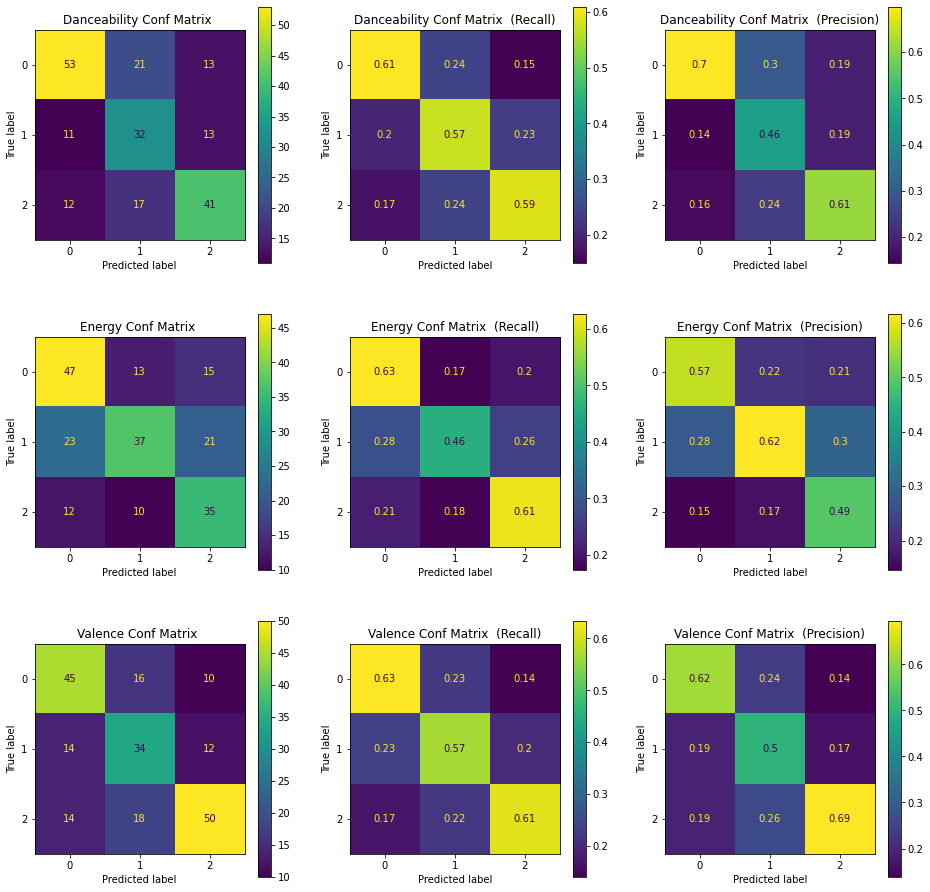

In [ ]:
plot_confusion_matrix_grid(y_test_d_int, y_pred_d, y_test_e_int, y_pred_e, y_test_v_int, y_pred_v)

Play random song with given predicted danceability sentiment label

In [ ]:
random_song(2, X_test_d, y_test_d_int, y_pred_d)

Predicted Label: 2, True Label: 2


Play random song with given predicted energy sentiment label

In [ ]:
random_song(2, X_test_e, y_test_e_int, y_pred_e)

Predicted Label: 2, True Label: 2


Play random song with given predicted valence sentiment label

In [ ]:
random_song(2, X_test_v, y_test_v_int, y_pred_v)

Predicted Label: 2, True Label: 2


# LSTM

Helper functions

In [7]:
def create_lstm(num_layers, num_units, bidirectional):
  model_layers = [layers.Input((100, 15))]
  lstm = [layers.LSTM(num_units, return_sequences=layer < num_layers - 1) for layer in range(num_layers)]
  if bidirectional:
    lstm = [layers.Bidirectional(layer) for layer in lstm]
  model_layers += lstm
  model_layers += [layers.Dense(3, activation='softmax')]
  return models.Sequential(model_layers)


def create_and_train_lstm(params, X, X_val, y, y_val, batch_size=256, epochs=200, verbose=True):
  lstm = create_lstm(*params)
  lstm.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
  metrics = lstm.fit(
    X, y, validation_data=(X_val, y_val),
    batch_size=batch_size,
    epochs=epochs,
    callbacks=[callbacks.EarlyStopping(monitor='val_accuracy', patience=50, restore_best_weights=True)],
    verbose=verbose,
  ).history
  return lstm, metrics


def cross_validation(X_train, y_train, k_folds=4):
  num_layers = [1, 2, 3]
  num_units = [128, 256, 512]
  bidirectional = [False, True]
  
  best_params, max_accuracy = None, None
  total_configs = len(num_layers) * len(num_units) * len(bidirectional)
  
  for config_num, params in enumerate(product(num_layers, num_units, bidirectional)):   
    print(f'\r============ Progress: {config_num+1}/{total_configs} ============\n')
    print_hyperparameters(params)
    print()
    
    avg_accuracy = 0
    for fold in range(k_folds):
      print(f'\rCross Validation Progress: {fold+1}/{k_folds}', end='')

      X, X_val, y, y_val = train_val_split(X_train, y_train, fold, k_folds)
      _, metrics = create_and_train_lstm(params, X, X_val, y, y_val, epochs=50, verbose=False)
      avg_accuracy += max(metrics['val_accuracy'])
    
    avg_accuracy /= k_folds

    new_best = False
    if not best_params or avg_accuracy > max_accuracy:
      best_params = params
      max_accuracy = avg_accuracy
      new_best = True

    print(f'\rAverage Accuracy Over {k_folds}-Folds: {round(avg_accuracy * 100, 2)}%')
    print(f'New Best?: {new_best}\n')

  print('============ Finished ============\n')
  print_hyperparameters(best_params, True)
  
  return best_params


def print_hyperparameters(params, best=False):
  if best:
    print('>>>> Best Hyperparameters <<<<')
  else:
    print('>>>> Hyperparameters <<<<')
  print(f'Layers: {params[0]}')
  print(f'Units: {params[1]}')
  print(f'Bidirectional?: {params[2]}')

Hyperparameter grid search on danceability using 4-fold cross validation

In [ ]:
best_params_d = cross_validation(X_train_d, y_train_d)

============ Progress: 1/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 128
Bidirectional?: False

Average Accuracy Over 4-Folds: 59.67%
New Best?: True

============ Progress: 2/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 128
Bidirectional?: True

Average Accuracy Over 4-Folds: 62.97%
New Best?: True

============ Progress: 3/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 256
Bidirectional?: False

Average Accuracy Over 4-Folds: 59.43%
New Best?: False

============ Progress: 4/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 256
Bidirectional?: True

Average Accuracy Over 4-Folds: 65.09%
New Best?: True

============ Progress: 5/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 512
Bidirectional?: False

Average Accuracy Over 4-Folds: 59.43%
New Best?: False

============ Progress: 6/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 512
Bidirectional?: True

Average Accuracy Over 4-Folds: 62.38%
New Best?: False

Hyperparameter grid search on energy using 4-fold cross validation

In [ ]:
best_params_e = cross_validation(X_train_e, y_train_e)

============ Progress: 1/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 128
Bidirectional?: False

Average Accuracy Over 4-Folds: 63.44%
New Best?: True

============ Progress: 2/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 128
Bidirectional?: True

Average Accuracy Over 4-Folds: 65.45%
New Best?: True

============ Progress: 3/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 256
Bidirectional?: False

Average Accuracy Over 4-Folds: 65.09%
New Best?: False

============ Progress: 4/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 256
Bidirectional?: True

Average Accuracy Over 4-Folds: 66.75%
New Best?: True

============ Progress: 5/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 512
Bidirectional?: False

Average Accuracy Over 4-Folds: 64.27%
New Best?: False

============ Progress: 6/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 512
Bidirectional?: True

Average Accuracy Over 4-Folds: 68.63%
New Best?: True


Hyperparameter grid search on valence using 4-fold cross validation

In [8]:
best_params_v = cross_validation(X_train_v, y_train_v)

============ Progress: 1/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 128
Bidirectional?: False

Average Accuracy Over 4-Folds: 62.97%
New Best?: True

============ Progress: 2/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 128
Bidirectional?: True

Average Accuracy Over 4-Folds: 66.75%
New Best?: True

============ Progress: 3/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 256
Bidirectional?: False

Average Accuracy Over 4-Folds: 66.39%
New Best?: False

============ Progress: 4/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 256
Bidirectional?: True

Average Accuracy Over 4-Folds: 70.05%
New Best?: True

============ Progress: 5/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 512
Bidirectional?: False

Average Accuracy Over 4-Folds: 65.21%
New Best?: False

============ Progress: 6/18 ============

>>>> Hyperparameters <<<<
Layers: 1
Units: 512
Bidirectional?: True

Average Accuracy Over 4-Folds: 67.1%
New Best?: False


# LSTM Training

Train danceability model

In [9]:
best_params_d = (3, 256, True)
lstm_danceability, metrics_danceability = create_and_train_lstm(best_params_d, X_train_d, X_test_d, y_train_d, y_test_d)

Epoch 1/200
4/4 [==============================] - 16s 1s/step - loss: 1.1052 - accuracy: 0.3819 - val_loss: 1.0384 - val_accuracy: 0.4883
Epoch 2/200
4/4 [==============================] - 2s 433ms/step - loss: 1.0515 - accuracy: 0.4395 - val_loss: 1.0490 - val_accuracy: 0.4507
Epoch 3/200
4/4 [==============================] - 2s 440ms/step - loss: 0.9935 - accuracy: 0.4971 - val_loss: 0.9952 - val_accuracy: 0.5164
Epoch 4/200
4/4 [==============================] - 2s 440ms/step - loss: 0.9713 - accuracy: 0.5300 - val_loss: 1.0819 - val_accuracy: 0.4225
Epoch 5/200
4/4 [==============================] - 2s 438ms/step - loss: 0.9694 - accuracy: 0.5288 - val_loss: 0.9530 - val_accuracy: 0.5211
Epoch 6/200
4/4 [==============================] - 2s 444ms/step - loss: 0.9166 - accuracy: 0.5734 - val_loss: 0.9609 - val_accuracy: 0.5493
Epoch 7/200
4/4 [==============================] - 2s 440ms/step - loss: 0.8935 - accuracy: 0.5734 - val_loss: 0.9166 - val_accuracy: 0.5540
Epoch 8/200
4/4

Train energy model

In [10]:
best_params_e = (2, 512, True)
lstm_energy, metrics_energy = create_and_train_lstm(best_params_e, X_train_e, X_test_e, y_train_e, y_test_e)

Epoch 1/200
4/4 [==============================] - 12s 1s/step - loss: 1.1336 - accuracy: 0.3843 - val_loss: 1.0759 - val_accuracy: 0.4038
Epoch 2/200
4/4 [==============================] - 3s 751ms/step - loss: 1.0318 - accuracy: 0.4548 - val_loss: 1.0505 - val_accuracy: 0.4507
Epoch 3/200
4/4 [==============================] - 3s 754ms/step - loss: 0.9904 - accuracy: 0.5053 - val_loss: 1.0460 - val_accuracy: 0.4601
Epoch 4/200
4/4 [==============================] - 3s 752ms/step - loss: 0.9325 - accuracy: 0.5593 - val_loss: 1.0424 - val_accuracy: 0.5164
Epoch 5/200
4/4 [==============================] - 3s 747ms/step - loss: 0.9022 - accuracy: 0.5629 - val_loss: 1.0514 - val_accuracy: 0.5023
Epoch 6/200
4/4 [==============================] - 3s 749ms/step - loss: 0.8708 - accuracy: 0.5840 - val_loss: 1.0342 - val_accuracy: 0.5258
Epoch 7/200
4/4 [==============================] - 3s 759ms/step - loss: 0.8346 - accuracy: 0.6087 - val_loss: 1.0128 - val_accuracy: 0.5352
Epoch 8/200
4/4

Train valence model

In [11]:
best_params_v = (2, 512, True)
lstm_valence, metrics_valence = create_and_train_lstm(best_params_v, X_train_v, X_test_v, y_train_v, y_test_v)

Epoch 1/200
4/4 [==============================] - 12s 1s/step - loss: 1.1398 - accuracy: 0.3666 - val_loss: 1.0849 - val_accuracy: 0.4554
Epoch 2/200
4/4 [==============================] - 3s 749ms/step - loss: 1.0461 - accuracy: 0.5276 - val_loss: 1.0708 - val_accuracy: 0.4836
Epoch 3/200
4/4 [==============================] - 3s 758ms/step - loss: 1.0109 - accuracy: 0.5452 - val_loss: 1.0667 - val_accuracy: 0.4883
Epoch 4/200
4/4 [==============================] - 3s 745ms/step - loss: 0.9846 - accuracy: 0.5382 - val_loss: 1.0115 - val_accuracy: 0.5587
Epoch 5/200
4/4 [==============================] - 3s 736ms/step - loss: 0.9365 - accuracy: 0.5676 - val_loss: 0.9964 - val_accuracy: 0.5587
Epoch 6/200
4/4 [==============================] - 3s 737ms/step - loss: 0.8797 - accuracy: 0.5911 - val_loss: 0.9717 - val_accuracy: 0.5211
Epoch 7/200
4/4 [==============================] - 3s 745ms/step - loss: 0.8771 - accuracy: 0.5911 - val_loss: 1.1125 - val_accuracy: 0.5070
Epoch 8/200
4/4

Save LSTMs

In [12]:
lstm_danceability.save('/content/drive/Shareddrives/CIS 522 Final Project/lstm_danceability_harm')
lstm_energy.save('/content/drive/Shareddrives/CIS 522 Final Project/lstm_energy_harm')
lstm_valence.save('/content/drive/Shareddrives/CIS 522 Final Project/lstm_valence_harm')

INFO:tensorflow:Assets written to: /content/drive/Shareddrives/CIS 522 Final Project/lstm_danceability_harm/assets


INFO:tensorflow:Assets written to: /content/drive/Shareddrives/CIS 522 Final Project/lstm_danceability_harm/assets


INFO:tensorflow:Assets written to: /content/drive/Shareddrives/CIS 522 Final Project/lstm_energy_harm/assets


INFO:tensorflow:Assets written to: /content/drive/Shareddrives/CIS 522 Final Project/lstm_energy_harm/assets


INFO:tensorflow:Assets written to: /content/drive/Shareddrives/CIS 522 Final Project/lstm_valence_harm/assets


INFO:tensorflow:Assets written to: /content/drive/Shareddrives/CIS 522 Final Project/lstm_valence_harm/assets


Plot losses and accuracies

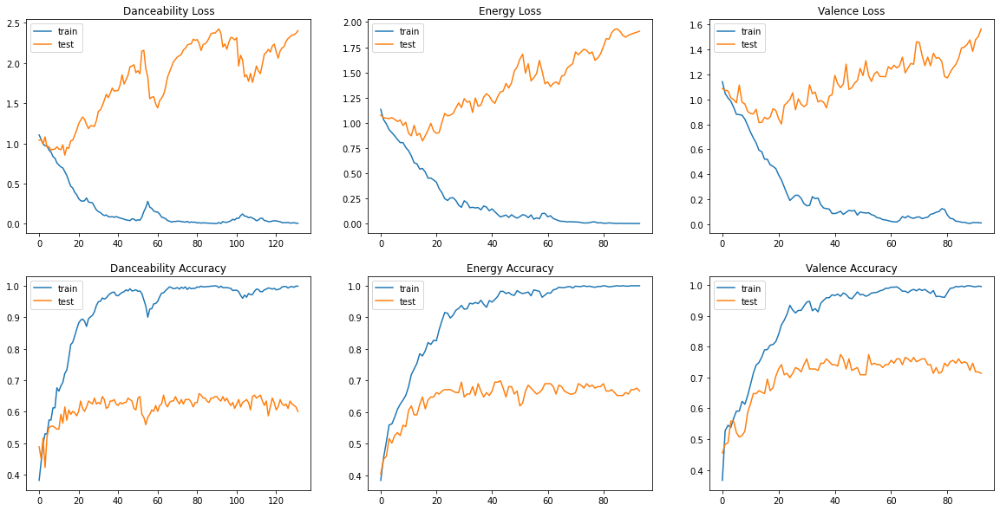

In [13]:
fig, axs = plt.subplots(2, 3, figsize=(20, 10))
axs = [[axs[0][i], axs[1][i]] for i in range(3)]
metrics = [
  ('Danceability', metrics_danceability),
  ('Energy', metrics_energy),
  ('Valence', metrics_valence)
]

for (target_name, target_metrics), (ax1, ax2) in zip(metrics, axs):
  ax1.set_title(f'{target_name} Loss')
  ax1.plot(target_metrics['loss'],)
  ax1.plot(target_metrics['val_loss'])
  ax1.legend(['train', 'test'])

  ax2.set_title(f'{target_name} Accuracy')
  ax2.plot(target_metrics['accuracy'])
  ax2.plot(target_metrics['val_accuracy'])
  ax2.legend(['train', 'test'])

plt.show()

Make predictions on test set

In [14]:
y_true_d = np.argmax(y_test_d, axis=1)
y_true_e = np.argmax(y_test_e, axis=1)
y_true_v = np.argmax(y_test_v, axis=1)

y_pred_d = np.argmax(lstm_danceability.predict(X_test_d), axis=1)
y_pred_e = np.argmax(lstm_energy.predict(X_test_e), axis=1)
y_pred_v = np.argmax(lstm_valence.predict(X_test_v), axis=1)

Print lstm accuracies

In [15]:
# get accuracies
acc_d = accuracy_score(y_true_d, y_pred_d)
acc_e = accuracy_score(y_true_e, y_pred_e)
acc_v = accuracy_score(y_true_v, y_pred_v)

# print accuracies
print(f'Danceability Accuracy: {round(acc_d * 100, 2)}%')
print(f'Energy Accuracy: {round(acc_e * 100, 2)}%')
print(f'Valence Accuracy: {round(acc_v * 100, 2)}%')

Danceability Accuracy: 65.73%
Energy Accuracy: 69.95%
Valence Accuracy: 77.46%


Plot confusion matrices

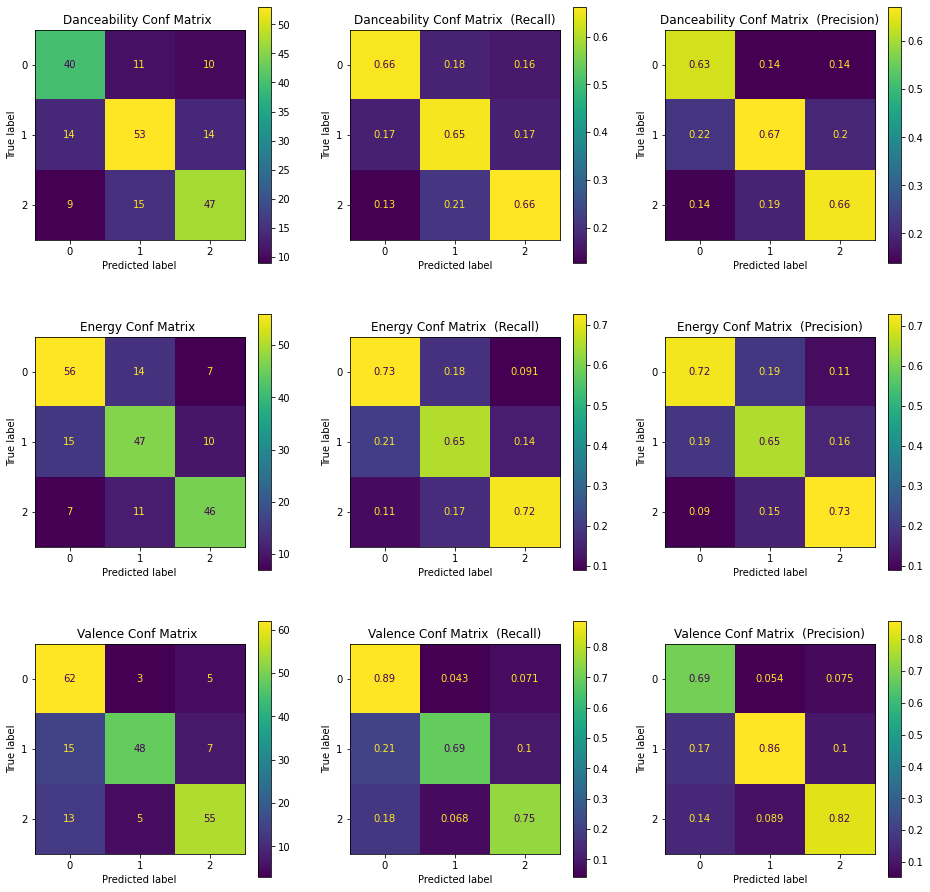

In [16]:
plot_confusion_matrix_grid(y_true_d, y_pred_d, y_true_e, y_pred_e, y_true_v, y_pred_v)

Play random song with given predicted danceability sentiment label

In [20]:
random_song(2, X_test_d, y_test_d_int, y_pred_d)

Predicted Label: 2, True Label: 2


Play random song with given predicted energy sentiment label

In [21]:
random_song(2, X_test_e, y_test_e_int, y_pred_e)

Predicted Label: 2, True Label: 2


Play random song with given predicted valence sentiment label

In [22]:
random_song(2, X_test_v, y_test_v_int, y_pred_v)

Predicted Label: 2, True Label: 2


# Results

Play random song classified as **sad**

In [24]:
random_song(0, X_test_v, y_true_v, y_pred_v)

Predicted Label: 0, True Label: 0


Play random song classified as **neutral**

In [47]:
random_song(1, X_test_v, y_true_v, y_pred_v)

Predicted Label: 1, True Label: 1


Play random song classified as **happy**

In [42]:
random_song(2, X_test_v, y_true_v, y_pred_v)

Predicted Label: 2, True Label: 2


Play random song classified as **not energetic**

In [32]:
random_song(0, X_test_e, y_true_e, y_pred_e)

Predicted Label: 0, True Label: 0


Play random song classified as **somewhat energetic**

In [36]:
random_song(1, X_test_e, y_true_e, y_pred_e)

Predicted Label: 1, True Label: 1


Play random song classified as **very energetic**


In [37]:
random_song(2, X_test_e, y_true_e, y_pred_e)

Predicted Label: 2, True Label: 2


Play random song classified as **not danceable**

In [38]:
random_song(0, X_test_d, y_true_d, y_pred_d)

Predicted Label: 0, True Label: 0


Play random song classified as **somewhat danceable**

In [39]:
random_song(1, X_test_d, y_true_d, y_pred_d)

Predicted Label: 1, True Label: 1


Play random song classified as **very danceable**

In [40]:
random_song(2, X_test_d, y_true_d, y_pred_d)

Predicted Label: 2, True Label: 2
